In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
dataset_directory = Path('/kaggle/input/gdz-elektrik-datathon-2023')

df = pd.read_csv(dataset_directory / 'train.csv')
df_med = pd.read_csv(dataset_directory / 'med.csv')

# Convert datetime columns to datetime type and extract date for merging major event days
df['Tarih'] = pd.to_datetime(df['Tarih'])
df['date'] = pd.to_datetime(df['Tarih'].dt.date)
df_med['Tarih'] = pd.to_datetime(df_med['Tarih'])

# Merge major event days with training set
df_med['is_med'] = 1
df = df.merge(df_med.rename(columns={'Tarih': 'date'}), on='date', how='left')
df['is_med'] = df['is_med'].fillna(0).astype(np.uint8)

# Set test set target values to NaNs
df.loc[df['Tarih'] >= '2022-08-01 00:00:00', 'Dağıtılan Enerji (MWh)'] = np.nan

start_date, end_date = df['Tarih'].min(), df['Tarih'].max()
print(f'Dataset Shape: {df.shape} - [{start_date} - {end_date}]')

Dataset Shape: (40152, 4) - [2018-01-01 00:00:00 - 2022-07-31 23:00:00]


In [3]:
def visualize_timeseries_target(df, datetime_column, target_column, start_date, end_date, name):

    """
    Visualize time series target on specified period
    
    Parameters
    ----------
    df: pandas.DataFrame
        Dataframe with given datetime and target columns
        
    datetime_column: str
        Name of the datetime column
        
    target_column: str
        Name of the target column
        
    start_date: str
        Start date
        
    end_date: str
        End date
        
    name: str
        Name of the data
    """

    date_idx = (df[datetime_column] >= start_date) & (df[datetime_column] <= end_date)
    med_idx = df['is_med'] == 1

    fig, ax = plt.subplots(figsize=(24, 6), dpi=100)
    ax.plot(df.loc[date_idx].set_index(datetime_column)[target_column], linewidth=2)
    for _, df_date in df.loc[date_idx & med_idx].groupby('date'):
        ax.plot(df_date.set_index(datetime_column)[target_column], color='red', linewidth=2)

    ax.tick_params(axis='x', labelsize=12.5, pad=10)
    ax.tick_params(axis='y', labelsize=12.5, pad=10)
    ax.set_title(f'{name} - [{start_date}, {end_date}) - {target_column}', size=20, pad=15)
    plt.show()


In [4]:
df['month'] = df['Tarih'].dt.month.astype(np.uint8)
df['year'] = df['Tarih'].dt.year.astype(np.uint16)

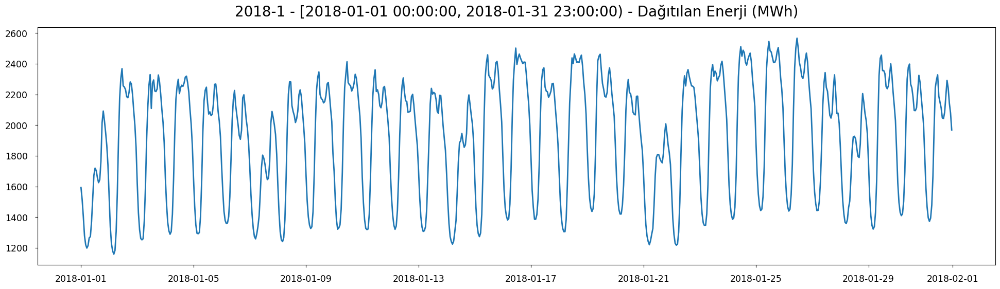

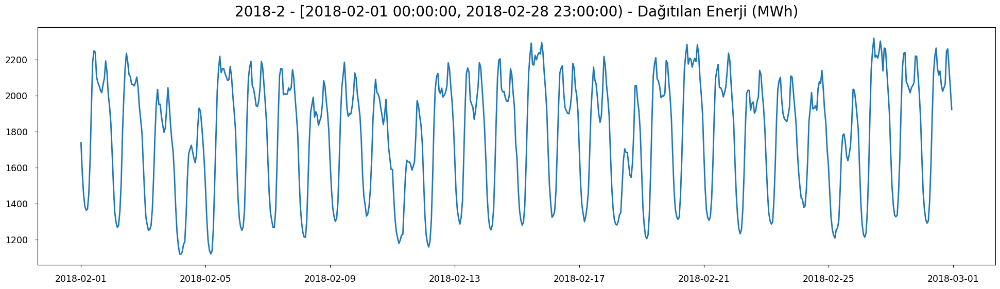

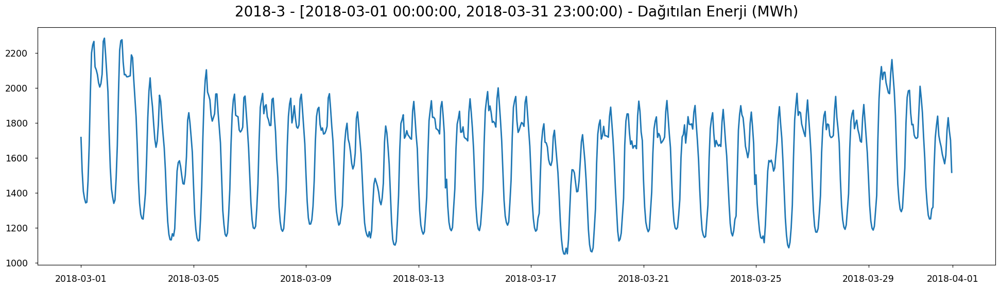

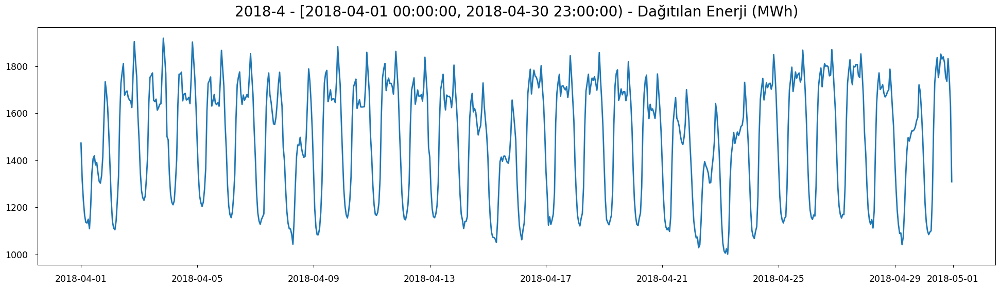

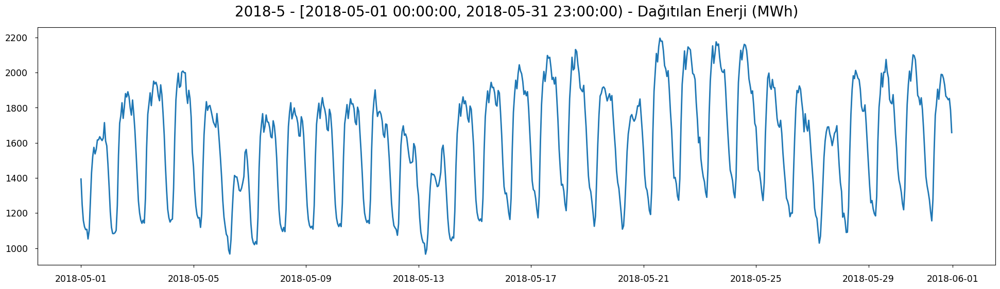

...

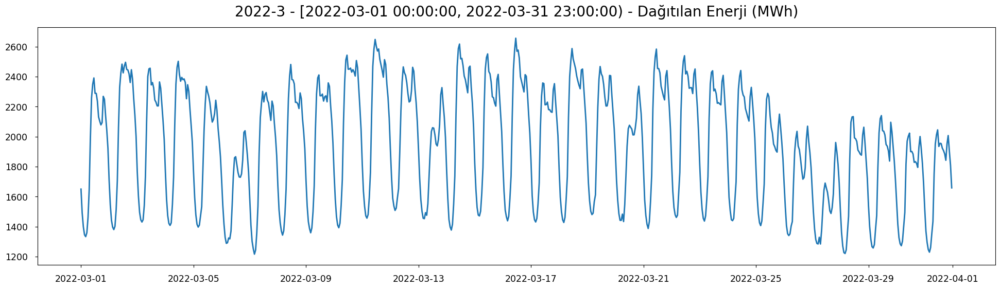

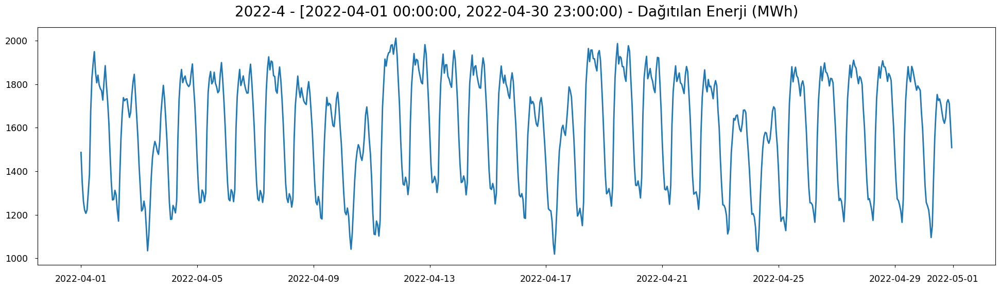

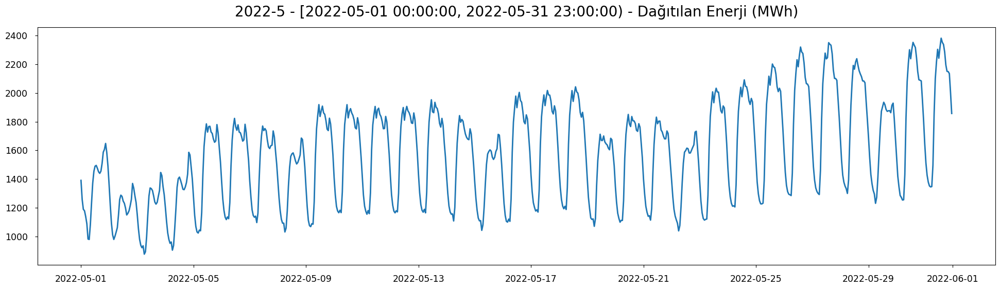

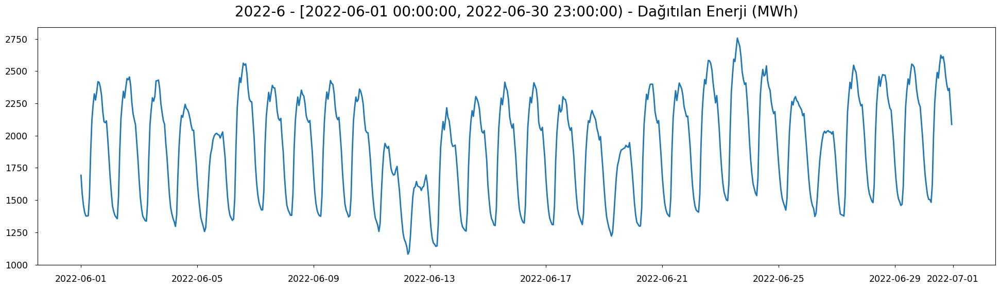

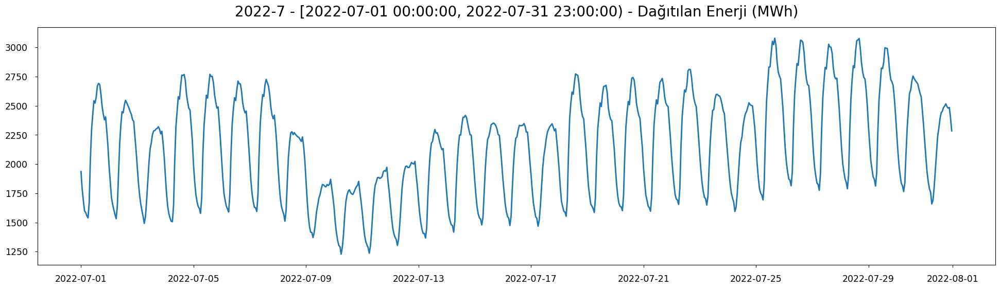

In [5]:
for (year, month), df_group in df.groupby(['year', 'month']):
    visualize_timeseries_target(
        df=df_group,
        datetime_column='Tarih',
        target_column='Dağıtılan Enerji (MWh)',
        start_date=df_group['Tarih'].min(),
        end_date=df_group['Tarih'].max(),
        name=f'{year}-{month}'
    )

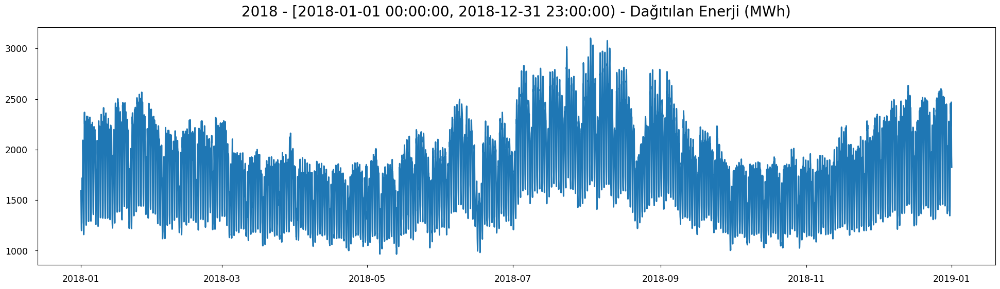

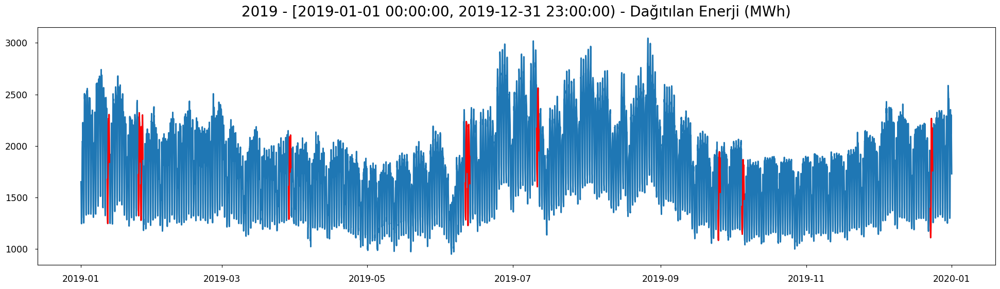

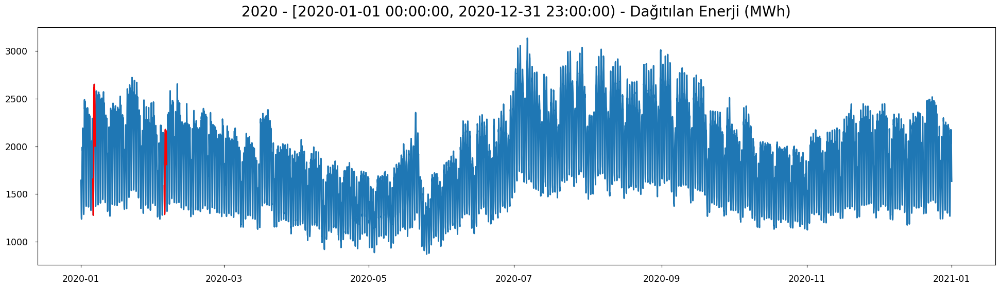

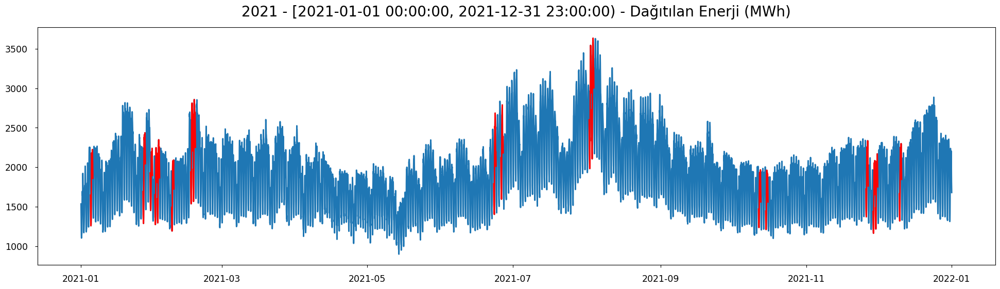

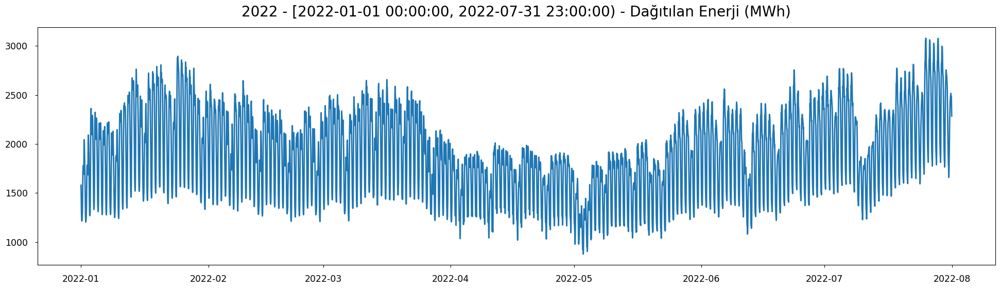

In [6]:
for year, df_group in df.groupby(['year']):
    visualize_timeseries_target(
        df=df_group,
        datetime_column='Tarih',
        target_column='Dağıtılan Enerji (MWh)',
        start_date=df_group['Tarih'].min(),
        end_date=df_group['Tarih'].max(),
        name=year
    )

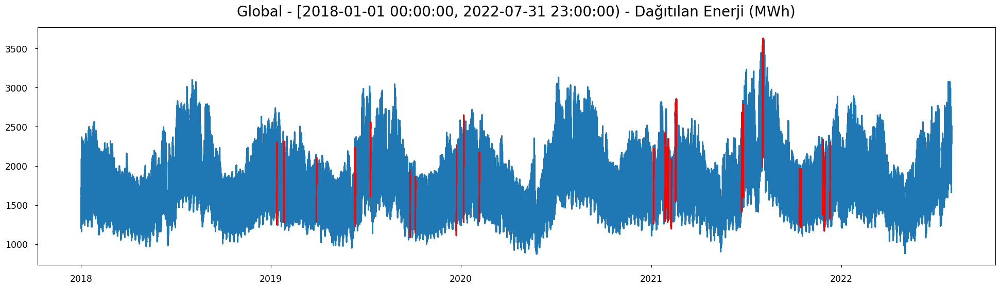

In [7]:
visualize_timeseries_target(
    df=df,
    datetime_column='Tarih',
    target_column='Dağıtılan Enerji (MWh)',
    start_date=df['Tarih'].min(),
    end_date=df['Tarih'].max(),
    name='Global'
)